# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

In [4]:
!pip install sentence_transformers
!pip install pymystem3

  Obtaining dependency information for sentence_transformers from https://files.pythonhosted.org/packages/06/97/57afa3d05801b6b9305f96a7ce5995e12c1d2ba25ce66747de107816b0b5/sentence_transformers-2.3.1-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.8/132.8 kB 7.1 MB/s eta 0:00:00


In [5]:
import pandas as pd
import numpy as np
import math
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg



import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, Flatten,AvgPool2D,BatchNormalization,Activation,MaxPooling2D,Dropout,GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.applications.resnet import ResNet50


import keras_nlp

from pymystem3 import Mystem
import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords as nltk_stopwords
import spacy

import os
from pathlib import Path
from tqdm import notebook
import pandas as pd
import numpy as np
import pickle

import sentence_transformers
from sentence_transformers import SentenceTransformer, util

import catboost

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.model_selection import GroupShuffleSplit

from PIL import Image
from pathlib import Path
import glob
import os

%autosave 600

Autosaving every 600 seconds


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Using TensorFlow backend


In [6]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames[:5]:
        print(os.path.join(dirname, filename))

/kaggle/input/query-image/to_upload/test_queries.csv
/kaggle/input/query-image/to_upload/CrowdAnnotations.tsv
/kaggle/input/query-image/to_upload/image_search.ipynb
/kaggle/input/query-image/to_upload/ExpertAnnotations.tsv
/kaggle/input/query-image/to_upload/train_dataset.csv
/kaggle/input/query-image/to_upload/train_images/280706862_14c30d734a.jpg
/kaggle/input/query-image/to_upload/train_images/929679367_ff8c7df2ee.jpg
/kaggle/input/query-image/to_upload/train_images/1317292658_ba29330a0b.jpg
/kaggle/input/query-image/to_upload/train_images/3411393875_a9ff73c67a.jpg
/kaggle/input/query-image/to_upload/train_images/3619416477_9d18580a14.jpg
/kaggle/input/query-image/to_upload/.ipynb_checkpoints/image_search-checkpoint.ipynb
/kaggle/input/query-image/to_upload/test_images/1319634306_816f21677f.jpg
/kaggle/input/query-image/to_upload/test_images/3163198309_bbfe504f0a.jpg
/kaggle/input/query-image/to_upload/test_images/2308256827_3c0a7d514d.jpg
/kaggle/input/query-image/to_upload/test_im

# Загрузка данных

In [7]:
# читаем файл с ответами краудсорсинга
crowd = pd.read_csv('/kaggle/input/query-image/to_upload/CrowdAnnotations.tsv', sep='\t', header=None)

In [8]:
crowd.shape

(47830, 5)

In [9]:
crowd.head()

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [90]:
expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   0          5822 non-null   object
 1   1          5822 non-null   object
 2   2          5822 non-null   int64 
 3   3          5822 non-null   int64 
 4   4          5822 non-null   int64 
 5   string     5822 non-null   object
 6   most_frec  5822 non-null   object
dtypes: int64(3), object(4)
memory usage: 318.5+ KB


In [91]:
expert.duplicated().sum()

0

In [10]:
# читаем файл с ответами экспертов
expert = pd.read_csv('/kaggle/input/query-image/to_upload/ExpertAnnotations.tsv', sep='\t', header=None)

expert.head()

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [89]:
expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   0          5822 non-null   object
 1   1          5822 non-null   object
 2   2          5822 non-null   int64 
 3   3          5822 non-null   int64 
 4   4          5822 non-null   int64 
 5   string     5822 non-null   object
 6   most_frec  5822 non-null   object
dtypes: int64(3), object(4)
memory usage: 318.5+ KB


In [11]:
expert.shape

(5822, 5)

In [92]:
expert.duplicated().sum()

0

## Вывод
Данные успешно загружены, аномалий и дубликатов не обнаружено

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [93]:
# функция для обьединения значений и превращения их в строку
def join_str(df):
    row = df[-3:].values.astype('str').tolist()
    concatenated_str = ''.join(row)
    return concatenated_str

In [13]:
# Функция для нахождения наиболее часто встречающегося символа в строке или -1
def most_common_symbol(string):
    counter = Counter(string)
    if all(value == 1 for value in counter.values()):
        return -1
    else:
        return counter.most_common(1)[0][0]

Принимаем за истину наиболее часто встречающееся значение

In [14]:
expert['string'] = expert.apply(join_str, axis=1)
expert['most_frec'] = expert['string'].apply(most_common_symbol)
expert.head()

,0,1,2,3,4,string,most_frec
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,111,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,112,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,112,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,122,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,112,1


In [15]:
crowd[2].value_counts(dropna=False)

2
0.000000    41970
0.333333     3000
0.666667     1360
1.000000     1323
0.250000       96
0.500000       27
0.200000       22
0.750000        9
0.600000        8
0.400000        8
0.800000        4
0.166667        3
Name: count, dtype: int64

In [16]:
merged = crowd.merge(expert[[0, 1,'string', 'most_frec']], on=[0,1], how = 'outer')

In [17]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   0          51323 non-null  object 
 1   1          51323 non-null  object 
 2   2          47830 non-null  float64
 3   3          47830 non-null  float64
 4   4          47830 non-null  float64
 5   string     5822 non-null   object 
 6   most_frec  5822 non-null   object 
dtypes: float64(3), object(4)
memory usage: 2.7+ MB


In [18]:
merged['most_frec'].value_counts(dropna=False)

most_frec
NaN    45501
1       3327
2       1566
3        492
4        311
-1       126
Name: count, dtype: int64

In [19]:
# функция для выставления итоговой оценки

def mark(df):
    
    if df['most_frec']==-1: # если нет самого часто встречающегося значения, тогда берем из краудсорсинга
        return df[2]
    
    else:
      # Поскольку оценки показывают уверенность в соответствиизаменим их на условно вероятность.
        if df['most_frec']=='1': 
            return 0.0
        elif df['most_frec']=='2':
            return 0.3
        elif df['most_frec']=='3':
            return 0.75  
        elif isinstance(df['most_frec'], str)==False:
            return df[2]
        else:
            return 1.0 

In [20]:
# финальная оценка булет нашем таргетом
merged['final_mark'] = merged.apply(mark, axis=1)

In [21]:
merged['final_mark'].value_counts(dropna=False)

final_mark
0.000000    43713
0.333333     2757
0.300000     1566
1.000000     1373
0.666667     1207
0.750000      499
0.250000       91
NaN            55
0.500000       23
0.200000       20
0.600000        8
0.400000        6
0.166667        3
0.800000        2
Name: count, dtype: int64

In [22]:
merged[merged['final_mark'].isna()].head()

,0,1,2,3,4,string,most_frec,final_mark
47860,1122944218_8eb3607403.jpg,3325497914_f9014d615b.jpg#2,NaN,NaN,NaN,234,-1,NaN
48004,136886677_6026c622eb.jpg,2877503811_4e311253ec.jpg#2,NaN,NaN,NaN,123,-1,NaN
48007,136886677_6026c622eb.jpg,354642192_3b7666a2dd.jpg#2,NaN,NaN,NaN,123,-1,NaN
48010,136886677_6026c622eb.jpg,801607443_f15956d1ce.jpg#2,NaN,NaN,NaN,123,-1,NaN
48090,1472230829_803818a383.jpg,354642192_3b7666a2dd.jpg#2,NaN,NaN,NaN,123,-1,NaN


In [23]:
# Удаляем пропуски, их 55
merged = merged[merged['final_mark'].notna()]

In [24]:
merged.head()

,0,1,2,3,4,string,most_frec,final_mark
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3.0,0.0,NaN,NaN,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0.0,3.0,NaN,NaN,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0.0,3.0,NaN,NaN,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0.0,3.0,NaN,NaN,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0.0,3.0,NaN,NaN,0.0


In [25]:
merged.tail()

,0,1,2,3,4,string,most_frec,final_mark
51318,997722733_0cb5439472.jpg,2641770481_c98465ff35.jpg#2,NaN,NaN,NaN,112,1,0.0
51319,997722733_0cb5439472.jpg,2932740428_b15384f389.jpg#2,NaN,NaN,NaN,112,1,0.0
51320,997722733_0cb5439472.jpg,2968182121_b3b491df85.jpg#2,NaN,NaN,NaN,111,1,0.0
51321,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,NaN,NaN,NaN,111,1,0.0
51322,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,NaN,NaN,NaN,111,1,0.0


In [26]:
train_target = merged[[0, 1, 'final_mark']]

In [27]:
train_target[train_target['final_mark'].isna()]

,0,1,final_mark


In [28]:
# загружаем тренировочный датасет
train_df = pd.read_csv('/kaggle/input/query-image/to_upload/train_dataset.csv')

train_df.head(20)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [29]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB



## Вывод

- Итоговую оценку перевели в сначения от 0 до 1,
- Больше доверия к экспертным оценкам 
- Если эксперты не пришли к единому мнению, тогда берем значение из краудсорсинга
- удалили пропущенные значения в таргете

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [30]:
# создаем список слов потенциально нарушающих законодательство
BAD_WORDS = ['child', 
             'children',
             'baby', 
             'babies',
             'boy',
             'boys',
             'girl',
             'girls',
             'kid',
             'kids',
             'infant',
             'infants',
             'toddler',
             'toddlers']

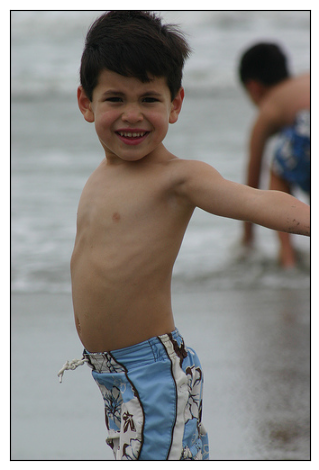

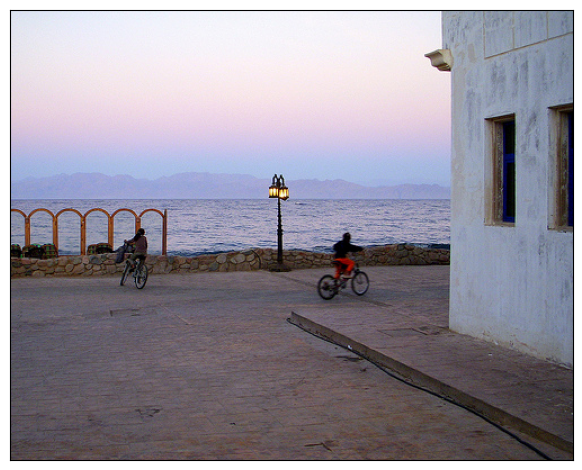

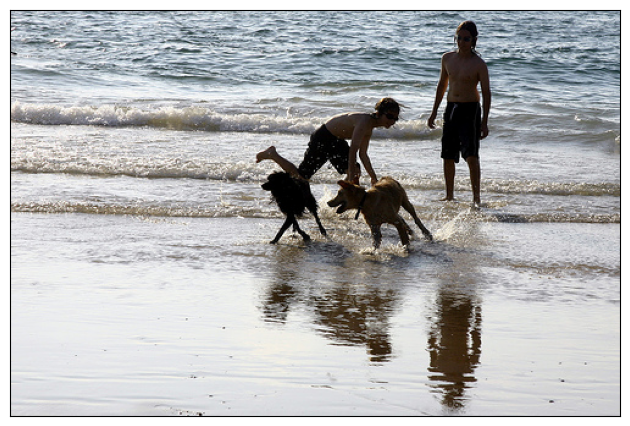

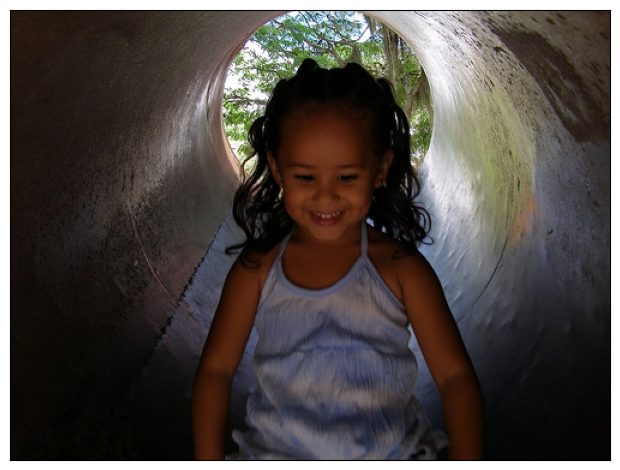

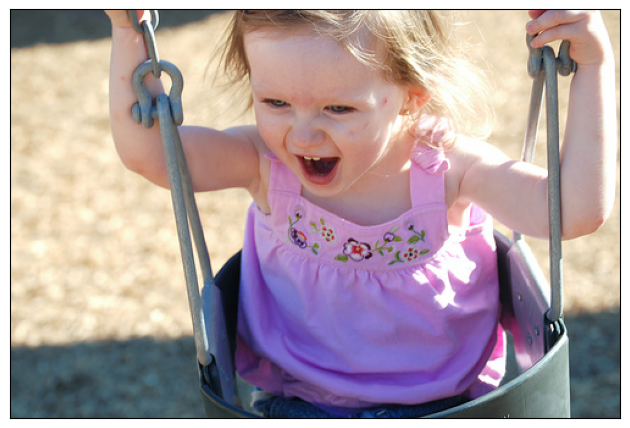

In [31]:
# посмотрим что за изображения нам попадутся по запросу включающему стоп слова
mask = (train_df['query_text']
        .apply(lambda query: any(word in query.lower() for word in BAD_WORDS)))

pics_to_remove = train_df[mask]['query_id'].apply(lambda x: x[:-2]).unique()

for image_path in np.random.choice(pics_to_remove, 5):
    img = mpimg.imread(os.path.join('/kaggle/input/query-image/to_upload/train_images', image_path))
    imgplot = plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.show()

In [32]:
# удалим такие изображения
a = train_df.shape[0]
train_df = train_df[~train_df['image'].isin(pics_to_remove)]
print(f'Удалено {a - train_df.shape[0]} изображений')
print('Размер датасета', train_df.shape[0])

Удалено 1752 изображений
Размер датасета 4070


In [33]:
train_df.shape

(4070, 3)

In [34]:
train_target = train_target.rename(columns={0:'image',1:'query_id'})

In [35]:
# Объеденим train и получившиеся массив
train_df = train_df.merge( train_target, how='inner',right_on=['image', 'query_id'], left_on=['image', 'query_id'])

In [36]:
train_df = train_df[train_df['final_mark'].notna()]

In [37]:
train_df = train_df[train_df['query_text'].notna()]


## Вывод

- удалили запросы и изображения, которые могуут вызвать проблемы с законодательством
- Удалено 1752 изображений
- Размер датасета 4070

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [38]:
# по возможности будем работать с GPU
device = "/GPU:0" if tf.test.is_gpu_available() else "/CPU:0"

In [39]:
# За основу возьмем предобученную нейронную сеть ResNet50
resnet_model  = ResNet50(input_shape=(224, 224, 3),
                         classes=1000,
                         include_top=False,
                       weights='imagenet')



94765736/94765736 [==============================] - 3s 0us/step


In [40]:
model = Sequential()

# Устанавливаем слой ResNet50 как не обучаемый (замораживаем веса)
resnet_model.trainable = False

# Добавляем модель ResNet50 внутрь последовательной модели
model.add(resnet_model)

# Добавляем слой Global Average Pooling
model.add(GlobalAveragePooling2D())

# Выводим структуру модели
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
Total params: 23587712 (89.98 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [41]:
train_df.head()

,image,query_id,query_text,final_mark
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0


Found 707 validated image filenames.


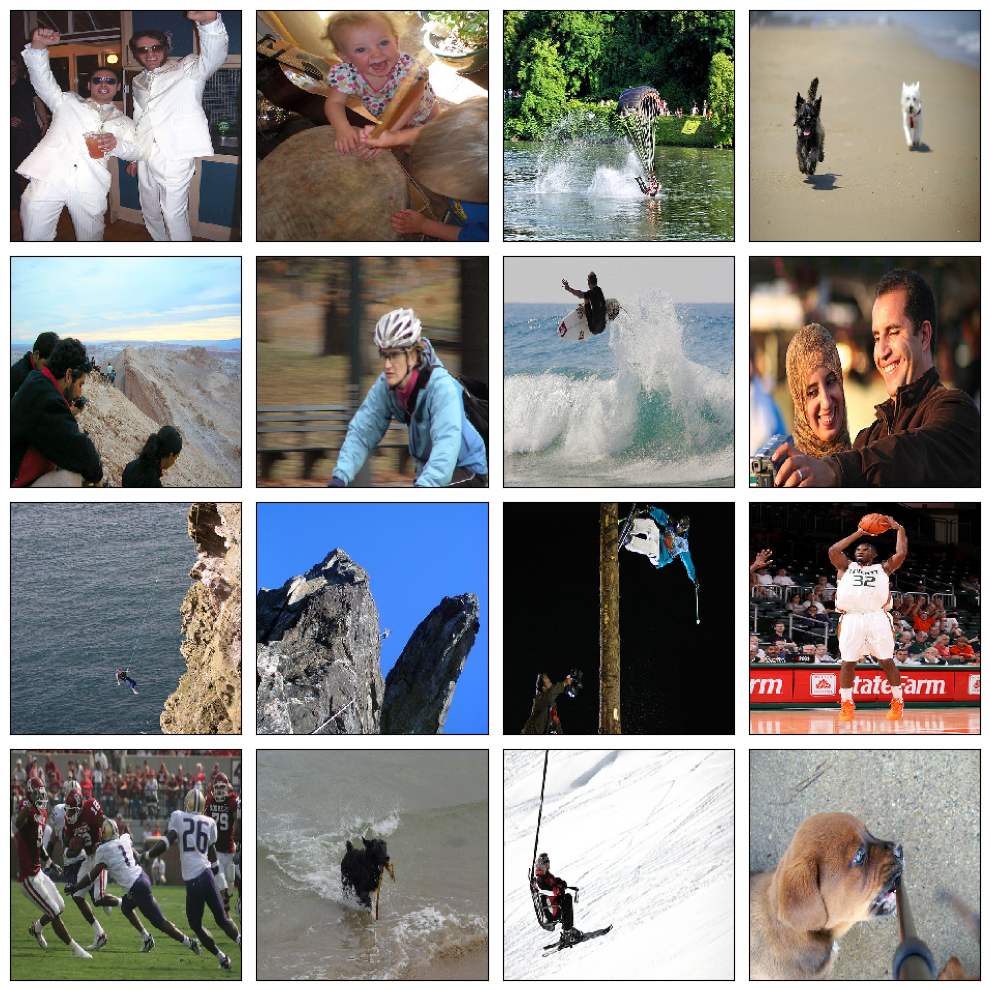

In [42]:
# Создадим загрузчик
train_datagen = ImageDataGenerator(rescale=1./255)
train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_df.drop_duplicates(subset=['image']),
        directory=Path('/kaggle/input/query-image/to_upload/', 'train_images'),
        x_col='image',
        y_col='final_mark',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=12345)

features, target = train_gen_flow.next()

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [43]:
# создадим эмбендинги изображений
with tf.device(device):
    image_embedings = model.predict(train_gen_flow)
    image_embedings.shape



45/45 [==============================] - 14s 247ms/step


In [44]:
image_embedings.shape

(707, 2048)


## Вывод

Были векторизированы изображения и созданы их эмбэндинги

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [45]:
# Загрузим трансформер Bert и препрцессор для него
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')
embeddings = []
text = list(train_df['query_text'].drop_duplicates()) # удалим повторяющиеся запросы
tokenized = preprocessor(text)
batch_size=32

213450/213450 [==============================] - 0s 1us/step


In [46]:
# Создадим эмбендинги текста
for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):

    tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
    token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
    mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

    batch = {'token_ids' : tokens,
            'segment_ids' : token_types, 
            'padding_mask' : mask}
    with tf.device(device):
        batch_embeddings = bert.predict(batch, verbose=0)

    embeddings.append(batch_embeddings['pooled_output'])

embeddings = np.concatenate(embeddings)

embeddings.shape

  0%|          | 0/30 [00:00<?, ?it/s]

(941, 768)


## Вывод

Были векторизированы запросы и созданы их эмбэндинги

## 5. Объединение векторов

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [48]:
image_embedings = pd.DataFrame(image_embedings)

In [49]:
image_embedings['image'] = train_df.drop_duplicates('image').reset_index(drop=True)['image']

In [50]:
embeddings = pd.DataFrame(embeddings)

In [51]:
embeddings['query_id'] = (train_df.drop_duplicates('query_text').reset_index(drop=True)['query_id'])

In [52]:
train_df = (train_df
         .merge(image_embedings,
                how = 'left',
                on='image')
         .merge(embeddings,
                'left',
                on='query_id')
        )

In [53]:
train_df.head()

,image,query_id,query_text,final_mark,0_x,1_x,2_x,3_x,4_x,5_x,...,758_y,759_y,760_y,761_y,762_y,763_y,764_y,765_y,766_y,767_y
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.003738,0.0,1.162414,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.006858,0.0,1.216187,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.003039,0.0,1.202651,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.000276,0.0,1.162103,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.000000,0.0,1.223259,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584



## Вывод

- Обединили ембендинги тектовые и графичсекие
- сопоставлены векторы запросов, изображений и целевой переменной
- тренировочный датасет готов.


## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [54]:
train_df.head()

,image,query_id,query_text,final_mark,0_x,1_x,2_x,3_x,4_x,5_x,...,758_y,759_y,760_y,761_y,762_y,763_y,764_y,765_y,766_y,767_y
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.003738,0.0,1.162414,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.006858,0.0,1.216187,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.003039,0.0,1.202651,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.000276,0.0,1.162103,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.0,0.000000,0.0,1.223259,0.0,...,0.853393,-0.34473,0.25654,-0.428818,-0.202048,-0.163491,-0.225796,0.999944,-0.691108,0.984584


In [55]:
train_df = train_df.reset_index(drop=True)

In [56]:
# Разделяем датасет на тест и трэйн
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=train_df.drop(columns=['image','query_id','query_text','final_mark']), y=train_df['final_mark'], groups=train_df['image']))
train_dataframe, test_dataframe = train_df.loc[train_indices], train_df.loc[test_indices]

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [57]:
train_dataframe.shape

(2807, 2820)

In [58]:
test_dataframe.shape

(1227, 2820)


## Вывод

разделили датасет на тестовую и тренировочную выборки с помощью GroupShuffleSplit

## Линейная регрессия

In [59]:
train_dataframe.columns = train_dataframe.columns.astype(str)

In [60]:
test_dataframe.columns = test_dataframe.columns.astype(str)

In [61]:
# Создаем объект ElasticNet
enet = ElasticNet(random_state=42)

# Создаем сетку параметров
alpha_values =  [0.01,0.001,0.1, 0.2, 0.4]


В качестве метрики выбираю MAE. Минимизируем абсолютное значение разницы между предсказанным и реальным значением

In [62]:
val_maes = []
# Перебираем все возможные значения alpha
for alpha in alpha_values:
    # Устанавливаем значение alpha
    enet.alpha = alpha

    # Подгоняем модель на тренировочном наборе
    enet.fit(train_dataframe.loc[:,'0_x':], train_dataframe['final_mark'])

    # Оцениваем модель на валидационном наборе
    val_predictions = enet.predict(test_dataframe.loc[:,'0_x':])
    val_mae = mean_absolute_error(test_dataframe['final_mark'], val_predictions)
    val_maes.append(val_mae)
    print("Alpha: ", alpha, "Validation MAE: ", val_mae)

# Выбираем наилучшее значение alpha
best_alpha = alpha_values[np.argmin(val_maes)]

# Устанавливаем наилучшее значение alpha
enet.alpha = best_alpha

# Подгоняем модель на тренировочном наборе
enet.fit(train_dataframe.loc[:,'0_x':], train_dataframe['final_mark'])

# Оцениваем модель на тестовом наборе
test_predictions = enet.predict(test_dataframe.loc[:,'0_x':])
test_mae = mean_absolute_error(test_dataframe['final_mark'], test_predictions)

print("Best alpha: ", best_alpha, "Test MAE: ", test_mae)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(

Alpha:  0.01 Validation MAE:  0.2493719061045697


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

Alpha:  0.001 Validation MAE:  0.23059000968609256


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(

Alpha:  0.1 Validation MAE:  0.2518483677916927


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

Alpha:  0.2 Validation MAE:  0.2518483677916927


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

Alpha:  0.4 Validation MAE:  0.2518483677916927


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

Best alpha:  0.001 Test MAE:  0.23059000968609256


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

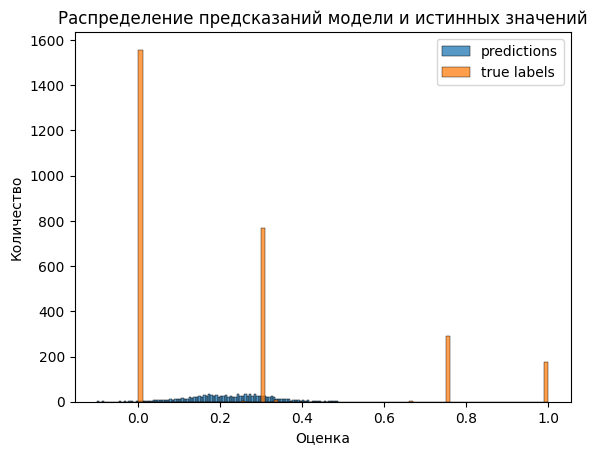

,0
count,1227.000000
mean,0.224002
std,0.095004
min,-0.100992
25%,0.158735
50%,0.227455
75%,0.292346
max,0.487580


In [63]:
sns.histplot(test_predictions, bins=100, label='predictions')
sns.histplot(train_dataframe['final_mark'], bins=100, label='true labels')
plt.title('Распределение предсказаний модели и истинных значений')
plt.xlabel('Оценка')
plt.ylabel('Количество')
plt.legend()
plt.show()
display(pd.DataFrame(test_predictions).describe())

In [64]:
train_dataframe.loc[:,'0_x':].shape[1]

2816

## Catboost

In [65]:
cb = catboost.CatBoostRegressor(iterations=3000,
                                learning_rate = 0.005,
                                verbose=100,
                                task_type='GPU',
                                eval_metric='RMSE',
                                random_seed=42)
train_pool = catboost.Pool(train_dataframe.drop(columns=['final_mark', 'image','query_id','query_text']),
                           train_dataframe['final_mark'])
val_pool = catboost.Pool(test_dataframe.drop(columns=['final_mark', 'image','query_id','query_text']),
                         test_dataframe['final_mark'])

In [66]:
cb.fit(train_pool,
       eval_set=val_pool,
       early_stopping_rounds=150)

0:	learn: 0.3102986	test: 0.3134427	best: 0.3134427 (0)	total: 246ms	remaining: 12m 18s
100:	learn: 0.3014008	test: 0.3075561	best: 0.3075561 (100)	total: 4.74s	remaining: 2m 16s
200:	learn: 0.2950800	test: 0.3039557	best: 0.3039557 (200)	total: 9s	remaining: 2m 5s
300:	learn: 0.2900241	test: 0.3018127	best: 0.3018127 (300)	total: 13.3s	remaining: 1m 59s
400:	learn: 0.2860200	test: 0.3005332	best: 0.3005332 (400)	total: 17.6s	remaining: 1m 54s
500:	learn: 0.2826353	test: 0.2996092	best: 0.2996066 (499)	total: 21.9s	remaining: 1m 49s
600:	learn: 0.2794694	test: 0.2988510	best: 0.2988487 (599)	total: 26.1s	remaining: 1m 44s
700:	learn: 0.2766771	test: 0.2983226	best: 0.2983178 (698)	total: 30.2s	remaining: 1m 39s
800:	learn: 0.2740366	test: 0.2977937	best: 0.2977814 (797)	total: 34.5s	remaining: 1m 34s
900:	learn: 0.2715067	test: 0.2975539	best: 0.2975539 (900)	total: 38.7s	remaining: 1m 30s
1000:	learn: 0.2692029	test: 0.2972146	best: 0.2972146 (1000)	total: 43s	remaining: 1m 25s
1100:	

In [67]:
cb_preds = cb.predict(test_dataframe.drop(columns=['final_mark', 'image','query_id','query_text']))

print(mean_absolute_error(test_dataframe['final_mark'], cb_preds))

0.23085402684552264


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

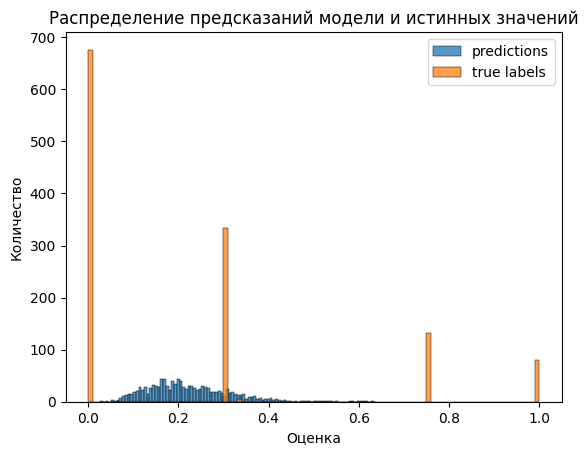

,0
count,1227.000000
mean,0.224737
std,0.095977
min,0.026775
25%,0.158370
50%,0.208152
75%,0.279475
max,0.632877


In [68]:
sns.histplot(cb_preds, bins=100, label='predictions')
sns.histplot(test_dataframe['final_mark'], bins=100, label='true labels')
plt.title('Распределение предсказаний модели и истинных значений')
plt.xlabel('Оценка')
plt.ylabel('Количество')
plt.legend()
plt.show()
display(pd.DataFrame(cb_preds).describe())

## Полносвязная нейронная сеть

In [69]:
model_nn = Sequential()
model_nn.add(Dense(1024, activation='relu', input_shape=(2816,)))
model_nn.add(BatchNormalization())
model_nn.add(Dense(512, activation='tanh'))
model_nn.add(Dropout(0.2))
model_nn.add(Dense(256, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(64, activation='relu'))
model_nn.add(Flatten())
model_nn.add(Dense(1, activation='linear'))


model_nn.compile(loss='mean_squared_error',
                optimizer = Adam(lr=0.0001),
                metrics=['mean_absolute_error'])

In [70]:
model_nn.fit(train_dataframe.loc[:,'0_x':], train_dataframe['final_mark'],
             epochs=250,
             batch_size=32,
             validation_data=(test_dataframe.loc[:,'0_x':], test_dataframe['final_mark']),
             validation_steps = math.ceil(train_dataframe.loc[:,'0_x':].shape[1]/32),
             verbose=2)

Epoch 1/250
88/88 - 6s - loss: 0.3125 - mean_absolute_error: 0.4084 - val_loss: 0.1146 - val_mean_absolute_error: 0.2603 - 6s/epoch - 68ms/step
Epoch 2/250
88/88 - 0s - loss: 0.1386 - mean_absolute_error: 0.2936 - 454ms/epoch - 5ms/step
Epoch 3/250
88/88 - 0s - loss: 0.1154 - mean_absolute_error: 0.2676 - 439ms/epoch - 5ms/step
Epoch 4/250
88/88 - 0s - loss: 0.1112 - mean_absolute_error: 0.2619 - 437ms/epoch - 5ms/step
Epoch 5/250
88/88 - 0s - loss: 0.1071 - mean_absolute_error: 0.2565 - 456ms/epoch - 5ms/step
Epoch 6/250
88/88 - 0s - loss: 0.1045 - mean_absolute_error: 0.2531 - 464ms/epoch - 5ms/step
Epoch 7/250
88/88 - 0s - loss: 0.0988 - mean_absolute_error: 0.2444 - 440ms/epoch - 5ms/step
Epoch 8/250
88/88 - 1s - loss: 0.0985 - mean_absolute_error: 0.2447 - 520ms/epoch - 6ms/step
Epoch 9/250
88/88 - 1s - loss: 0.0958 - mean_absolute_error: 0.2403 - 515ms/epoch - 6ms/step
Epoch 10/250
88/88 - 0s - loss: 0.0954 - mean_absolute_error: 0.2405 - 481ms/epoch - 5ms/step
Epoch 11/250
88/88

In [71]:
nn_preds = model_nn.predict(test_dataframe.loc[:,'0_x':])

39/39 [==============================] - 0s 2ms/step


0.23801528939254188


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(v

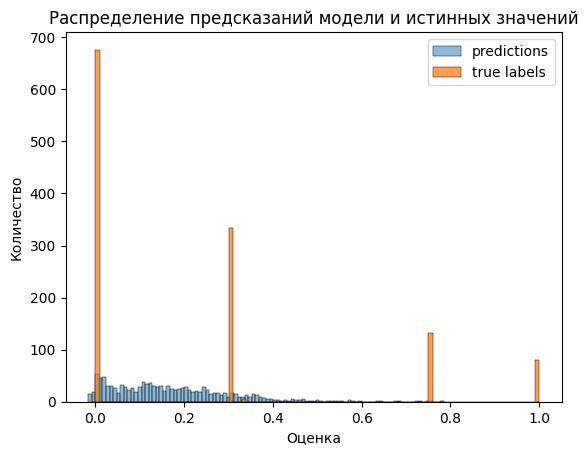

,0
count,1227.000000
mean,0.168915
std,0.135467
min,-0.016379
25%,0.061843
50%,0.144959
75%,0.247144
max,0.785083


In [72]:


print(mean_absolute_error(test_dataframe['final_mark'], nn_preds))

sns.histplot(nn_preds, bins=100, label='predictions')
sns.histplot(test_dataframe['final_mark'], bins=100, label='true labels')
plt.title('Распределение предсказаний модели и истинных значений')
plt.xlabel('Оценка')
plt.ylabel('Количество')
plt.legend()
plt.show()
display(pd.DataFrame(nn_preds).describe())


## Вывод

- была выбрана метрика MAE
- попробовали модель линейной регрессии, catboost и полносвязную нейронную сеть
- лучшей среди худших стала модель нейронной сети, ее и испытаем на тестовом датасете
- Все модели оказались не слишком хороши
- возможно проблема в метрике + в начале я превратил целевую переменную в классы. Возможно нужно посмотреть в сторону косинусного расстояния векторов (изображение - запрос)

## 7. Тестирование модели

Настало время протестировать модель. Для этого получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведим наиболее релевантное изображение. Сравним визуально качество поиска.

In [73]:
test_query = pd.read_csv('/kaggle/input/query-image/to_upload/test_queries.csv', index_col=[0], sep='|')
test_query.name = 'test_query'

In [74]:
test_image = pd.read_csv('/kaggle/input/query-image/to_upload/test_images.csv')
test_image.name = 'test_image'

In [75]:
PATH = '/kaggle/input/query-image/to_upload/test_images/'

In [76]:
test_image

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
...,...
95,2431120202_b24fe2333a.jpg
96,2399219552_bbba0a9a59.jpg
97,3091962081_194f2f3bd4.jpg
98,2670637584_d96efb8afa.jpg


In [78]:
test_datagen = ImageDataGenerator(rescale = 1./255)
test_gen_flow = train_datagen.flow_from_dataframe(
        dataframe = test_image,
        directory = Path('/kaggle/input/query-image/to_upload/', 'test_images'),
        x_col ='image',
        y_col = None,
        target_size = (224, 224),
        batch_size = 16,
        class_mode = 'input',
        seed = 12345)

Found 100 validated image filenames.


In [79]:
with tf.device(device):
    image_embedings = model.predict(test_gen_flow)
    image_embedings.shape

7/7 [==============================] - 1s 211ms/step


In [80]:
def txt_vec(text):
    
    test_embeddings = []
    tokenized = preprocessor(text)
    batch_size=4

    for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
        tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
        token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
        mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]
        batch = {'token_ids' : tokens,
                'segment_ids' : token_types, 
                'padding_mask' : mask}
        batch_embeddings = bert.predict(batch, verbose=0)
        test_embeddings.append(batch_embeddings['pooled_output'])

    text_embeddings_test = np.concatenate(test_embeddings)
    return text_embeddings_test

In [81]:
PATH = '/kaggle/input/query-image/to_upload'

In [82]:
def inference(text):

    bin_array = any(word in text.lower() for word in BAD_WORDS)
    if bin_array:
        print('-'*100)
        print()
        print(text)
        print()
        print('#'*77)
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## {s} ##')
        print('#'*77)
        print()
    else:
        text_embed = txt_vec(text=[text])
        feature = np.concatenate((image_embedings, np.resize(text_embed, (image_embedings.shape[0],768))), axis=1) # Тк входные тензоры 1 и 500, нам необходимо изменить размер массива
        
        predictions = model_nn.predict(feature)
        
        data = pd.concat((test_image, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
        top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
        top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))
        
        print()
        print(text)
        print()
        
        fig = plt.figure(figsize=(15,6))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(test_query['query_text']):
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', test_query.iloc[test_query[test_query['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()
        
        plt.show()
        
        print('-'*100)
    return None

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

A white dog with a branch in his mouth and a black dog .




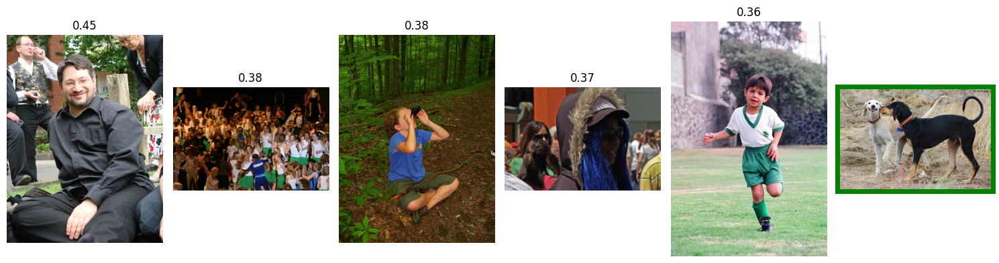

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

a guy and a girl jumping up in the air

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################



  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

the man is wearing a backpack and sunglasses while walking through an outdoor market .




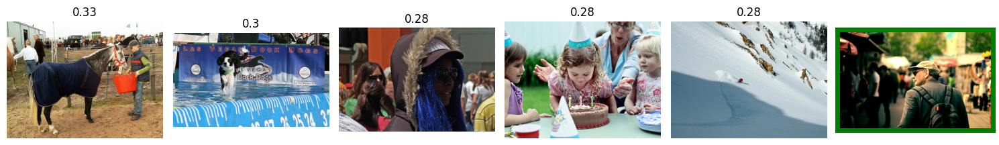

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

a man leans against a large robot .




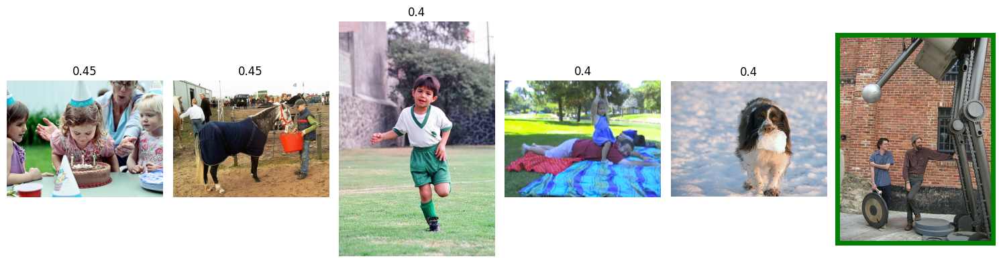

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

A man sits on the gravel by an ocean .




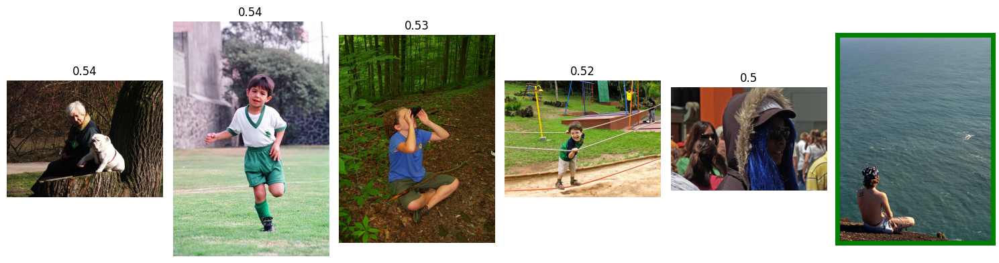

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

A white dog with beige spots is running through a field .




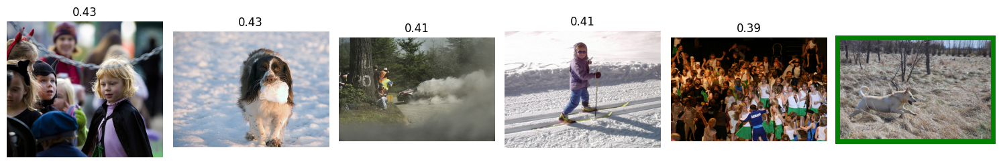

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

A brown dog is sitting in some long grass .




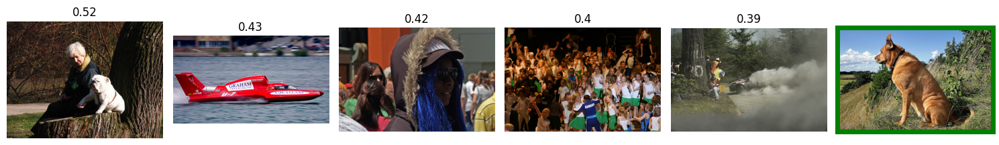

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

A salt-and-pepper-haired man with beard and glasses wearing black sits on the grass .




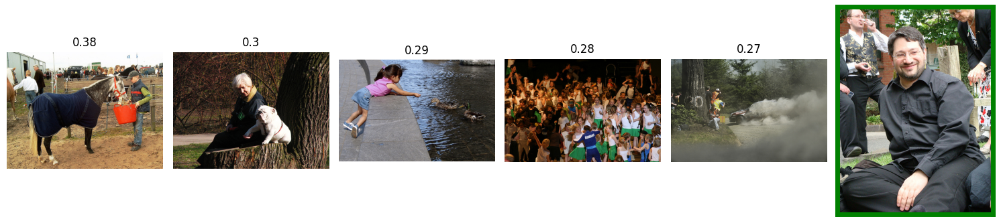

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 2ms/step

A blue bird flying over water .




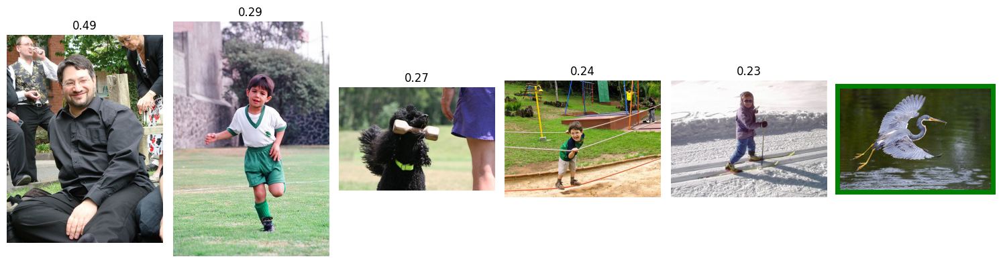

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Girls with orange hair standing on the street with some kind of bottle in their hand .

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################



In [83]:
test_phrases = list(test_query['query_text'].sample(10))
for phrase in test_phrases:
    inference(phrase)


## Вывод

- ни один пример не совпал с реальным изображением
- попробуем использовать предобученную модель, которая создавалась под похожую задачу

## Предобученная модель

In [84]:

# Загрузим модель
model_vit = SentenceTransformer('clip-ViT-B-32')

# Создадим список путей до файла
file_paths = list(glob.glob(str(Path(PATH, 'test_images', '*.jpg')))) # glob.glob - возвращает список путей к файлам и директориям

# Подадим данный список в clip-ViT-B-32 и получим эмбединги
image_embed = model_vit.encode([Image.open(i) for i in file_paths],
                                   convert_to_tensor=True,
                                   batch_size=32,
                                   show_progress_bar=True)

image_embed.shape

Batches:   0%|          | 0/4 [00:00<?, ?it/s]

torch.Size([100, 512])

In [85]:
def img_name(path):
    name = ''
    for i in reversed(path):
        if i =='\\':
            break
        else:
            name+=i
    return name[::-1]

counter_ban = 0
counter_true = 0
for i in range(test_query.shape[0]):
    bin_array = any(word in test_query.iloc[i]['query_text'].lower() for word in BAD_WORDS)
    if bin_array:
        counter_ban += 1
    else:
        image_embedings = model_vit.encode([test_query.iloc[i]['query_text']], 
                                               convert_to_tensor=True,
                                               show_progress_bar=False)

        top = util.semantic_search(image_embedings, image_embed, top_k=1)[0]
        target_name = test_query.iloc[test_query[test_query['query_text'] == test_query.iloc[i]['query_text']].index[0]]['image']
        predict_name = img_name(file_paths[top[0]['corpus_id']][-25:])
        if target_name == predict_name:
            counter_true += 1

In [86]:
print('Правильно распознанных картинок:', '{:.2%}'.format(counter_true / (test_query.shape[0] - counter_ban)))

Правильно распознанных картинок: 64.37%


In [87]:
def accordance(query_text, k: int):
    acc = []
    bin_array = any(word in query_text.lower() for word in BAD_WORDS)
    if bin_array:
        print('-'*100)
        print()
        print(query_text)
        print()
        print('#'*77)
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## {s} ##')
        print('#'*77)
        print()
    else:
        image_embedings = model_vit.encode([query_text], 
                                           convert_to_tensor=True,
                                           show_progress_bar=False)
        
        top = util.semantic_search(image_embedings, image_embed, top_k=k)[0] # Вычисляем косинусное расстояние и выводм максимальные k элементов
        print()
        print(query_text)
        print()
        fig = plt.figure(figsize=(15,6))
        plt.rcParams['axes.edgecolor'] = 'white'
        plt.rcParams['axes.linewidth'] = 5
        for i in range(k):
            fig.add_subplot(1, 6, i+1, title=round(top[i]['score'], 2))
            image = Image.open(file_paths[top[i]['corpus_id']])
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if query in list(test_query['query_text']):
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', test_query.iloc[test_query[test_query['query_text'] == query_text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()
        
        plt.show()
        
        print('-'*100)
    return None


Grey horse wearing blue cover eating from a orange bucket held by a person in a green shirt .




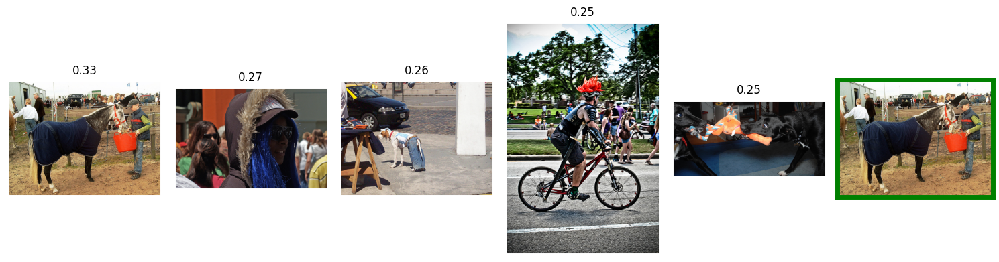

----------------------------------------------------------------------------------------------------

Women play lacrosse .




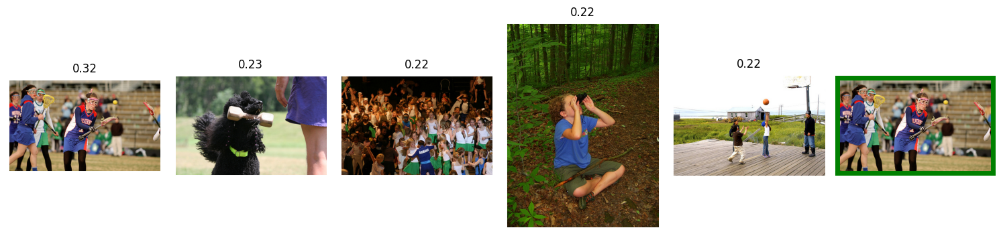

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

A man and two boys standing in spraying water .

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################


A dog is dressed in a shirt and pants on the side of the road .




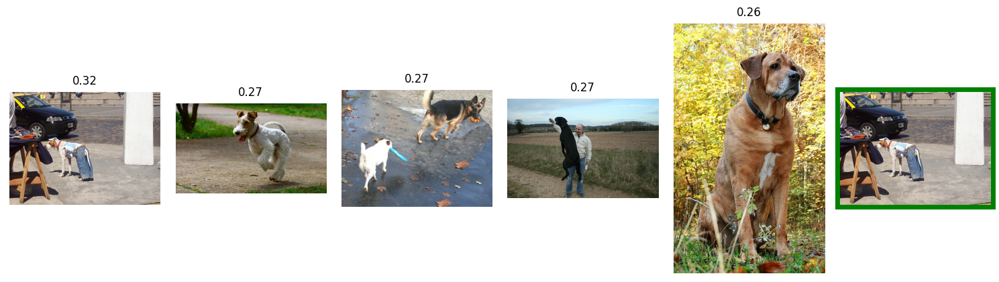

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Middle school aged kids are showing their school spirit at a pep ralley .

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################



In [88]:
k = 5
for query in list(test_query.sample(k)['query_text']):
    accordance(query_text = query, k = k)

## Вывод

- Как видно наша предобученная модель намного лучше справляется с задачей: во всех примерах она верно определила изображение, однако значение уверенности не превышало 0,33
- были векторизированы изображения и текстовые запросы
- удалены запросы со словами,которые могут быть незаконными
- В проекте мы попробовали самостоятельно предсказать изображение по запросу и создали 3 модели:
    - линейную регрессию
    - catboost
    - полносвязную нейронную сеть
    

## 8. Выводы

- Jupyter Notebook открыт
- Весь код выполняется без ошибок
- Ячейки с кодом расположены в порядке исполнения
- Исследовательский анализ данных выполнен
- Проверены экспертные оценки и краудсорсинговые оценки
- Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- Изображения векторизованы
- Текстовые запросы векторизованы
- Данные корректно разбиты на тренировочную и тестовую выборки
- Предложена метрика качества работы модели
- Предложена модель схожести изображений и текстового запроса
- Модель обучена
- По итогам обучения модели сделаны выводы
- Проведено тестирование работы модели
- По итогам тестирования визуально сравнили качество поиска